# Week 4- Assignment :Wifi in Seoul

In [95]:
#install library
#!conda install -c conda-forge geopy --yes 
#!conda install -c conda-forge folium=0.5.0 --yes 

#import library
import requests 
import xml
import folium 
import matplotlib.cm as cm
import matplotlib.colors as colors
import pandas as pd
import numpy as np

from pandas.io.json import json_normalize 
from sklearn.cluster import KMeans
from bs4 import BeautifulSoup
from geopy.geocoders import Nominatim 
print('Import finished')

Import finished


In [96]:
#data Downloaded from "Seoul data hub" https://data.seoul.go.kr/dataList/OA-1218/S/1/datasetView.do
df = pd.read_csv('seoul_public_wifi_location.csv',header=0, encoding='utf-8')
df.head(5)

,District,Type,Built by,Longitude,Latitude,ID
0,Gangnam-gu,Public facility,District,127.041003,37.508291,WF121001
1,Gangnam-gu,Public facility,District,127.064250,37.493850,WF121002
2,Gangnam-gu,Public facility,District,127.064250,37.493850,WF121003
3,Gangnam-gu,Public facility,District,127.064250,37.493850,WF121004
4,Gangnam-gu,Public facility,District,127.064250,37.493850,WF121005


# get address of Seoul

In [97]:
geolocator = Nominatim()
location = geolocator.geocode('Seoul, Korea')
latitude = location.latitude
longitude = location.longitude
print('The geograpical coordinate of the Seoul, Korea are {}, {}.'.format(latitude, longitude))

C:\Users\seo30\anaconda3\lib\site-packages\ipykernel_launcher.py:1: DeprecationWarning: Using Nominatim with the default "geopy/1.22.0" `user_agent` is strongly discouraged, as it violates Nominatim's ToS https://operations.osmfoundation.org/policies/nominatim/ and may possibly cause 403 and 429 HTTP errors. Please specify a custom `user_agent` with `Nominatim(user_agent="my-application")` or by overriding the default `user_agent`: `geopy.geocoders.options.default_user_agent = "my-application"`. In geopy 2.0 this will become an exception.
  """Entry point for launching an IPython kernel.


The geograpical coordinate of the Seoul, Korea are 37.5666791, 126.9782914.


# Map Public Wifi Spots to Seoul

In [98]:
map = folium.Map(location=[latitude, longitude], zoom_start=10)  
for lat, lng, district, id in zip(df['Latitude'], df['Longitude'], df['District'], df['ID']):
    lat=float(lat)
    try :
        lng=float(lng)
    except ValueError:
        print("ID "+id+' is in problem')
    label = '{}, {}'.format(district, id)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=1,
        popup=label,
        color='green',
        fill=True,
        fill_color='#3199cc',
        fill_opacity=0.3,
        parse_html=False).add_to(map)  
map

## Distribution of public Wifi AP based on district - Data frame and horizental graph


In [99]:
df_dist = df['District'].value_counts().rename_axis('District').reset_index(name='Number')
df_dist.head()

,District,Number
0,Gangnam-gu,864
1,Guro-gu,740
2,Joong-gu,694
3,Nowon-gu,614
4,Gangseo-gu,584


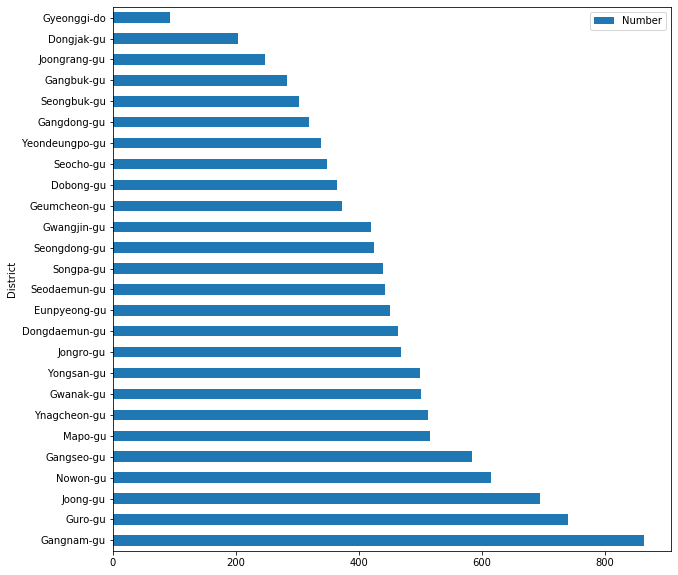

In [91]:
ax = df_dist.plot.barh(x='District', y='Number', rot=0, figsize=(10,10))

## Stats of AP (built by) - Data Frame and horizontal graph

In [92]:
df_built = df['Built by'].value_counts().rename_axis('Built by').reset_index(name='Number')
df_built.head()

,Built by,Number
0,Seoul City,3685
1,District,3594
2,Min. of Future(KT),981
3,KT,813
4,Min. of Future(SKT),695


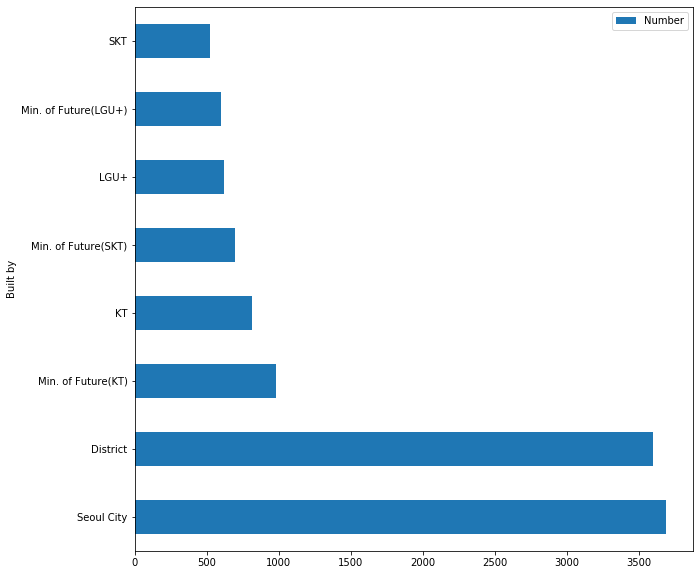

In [100]:
#horizontal graph (built by)
ax = df_built.plot.barh(x='Built by', y='Number', rot=0, figsize=(10,10))